In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import json
import matplotlib.pyplot as plt
import re
import nltk
from nltk.corpus import stopwords
from collections import Counter
import networkx as nx
from sklearn.metrics.pairwise import cosine_similarity as mat_cosine_similarity
from sklearn.preprocessing import normalize
import random
from matplotlib.colors import LinearSegmentedColormap

# Functions

In [2]:
##########################################################################################################
############## General Bag of Words Model functions ######################################################
##########################################################################################################

# Takes in two course names, the name of the column that holds the names, the dataframe, and the similarity matrix
# and returns their cosine similarity
def get_similarity(name1, name2, col_name, df, matrix):
    idx_1 = df[df[col_name] == name1].index
    idx_1 = idx_1[0]
    idx_2 = df[df[col_name] == name2].index
    idx_2 = idx_2[0]
    return matrix[idx_1, idx_2]

# Gets the course's cleaned description that is used to vectorize it
def get_clean_desc(df, course_name):
    idx_1 = df[df['department'] == course_name].index
    idx_1 = idx_1[0]
    return df.iloc[idx_1]['cleaned_description']

# Gets the course's regular description that is used to vectorize it
def get_reg_desc(df, course_name):
    idx_1 = df[df['course'] == course_name].index
    idx_1 = idx_1[0]
    return df.iloc[idx_1]['description_x']



#####################################################################################################
################ General Similarty Data and Visualization Tools #####################################
#####################################################################################################

# Return the n most common words shared between two strings.
def common_words(str1, str2, n):
    # Splitting the strings into words
    words_str1 = str1.split()
    words_str2 = str2.split()

    # Creating a dictionary to count the occurrences of each word in both strings
    word_count = {}
    for word in words_str1:
        if word in words_str2:
            word_count[word] = min(words_str1.count(word), words_str2.count(word))

    # Sorting the dictionary by the frequency of the words
    sorted_word_count = sorted(word_count.items(), key=lambda x: x[1], reverse=True)

    return sorted_word_count[0:n]


# Return the n most similar departments
def get_related(name, df, deps,  matrix, n):
    n=n+1
    idx = df[df['department'] == name].index
    sims = matrix[idx]
    # Get indices of sorted elements
    sorted_indices = np.argsort(sims)
    # Get indices of top n largest elements
    top_n_indices = sorted_indices[0][-n:][::-1]
    top_n_deps = np.array(deps)[top_n_indices]
    top_n_deps = np.delete(top_n_deps, np.where(top_n_deps == name))
    return top_n_deps

def get_threshold(matrix, max_pairs):
    """
    Find the threshold for similarity scores in the matrix.

    :param matrix: A 2D numpy array containing similarity scores between classes.
    :param max_pairs: Maximum number of class pairs with similarity above the threshold.
    :return: Threshold value.
    """

    # Check if the matrix is square
    if matrix.shape[0] != matrix.shape[1]:
        raise ValueError("Input must be a square matrix")

    # Get the upper triangle of the matrix, excluding the diagonal
    upper_triangle = np.triu(matrix, k=1)
    
    # Flatten and sort
    flat_upper = upper_triangle.flatten()
    sorted_similarities = np.sort(flat_upper[flat_upper != 0])[::-1]
    
    # Check if n is valid
    if max_pairs <= 0 or max_pairs > len(sorted_similarities):
        raise ValueError("max_pairs must be between 1 and the number of upper triangle elements")
    
    # Get the nth highest value
    threshold = sorted_similarities[max_pairs-1]

    return threshold

# Generating dataframe of related departments
def dep_sim_analysis(df, matrix, dep_name):
    related_departments = get_related('ENVIRON', df, matrix, 10)
    word_df = pd.DataFrame()
    for dept in related_departments:
        word_df[dept] = common_words(get_clean_desc(df, dep_name), get_clean_desc(df, dept), 10)
    return word_df

# Loading embeddings dataset

In [3]:
import ast
# Load data
df = pd.read_pickle('embeddings.pkl')

# Groupby department

In [4]:
# Get the department of each course
df['department'] = df['course'].str.extract(r'([A-Z]+)')
# Groupby Operation
df = df.groupby('department')['embedding'].apply(np.sum).reset_index()

In [5]:
df['embedding'] = df['embedding'].apply(lambda x: normalize([x])[0])

## Example of generating networks

In [6]:
# Make similarity matrix
matrix = [vec for vec in df['embedding']]
# Compute cosine similarities
similarity_matrix = mat_cosine_similarity(matrix)
#Find similar courses
deps = df['department'].tolist()

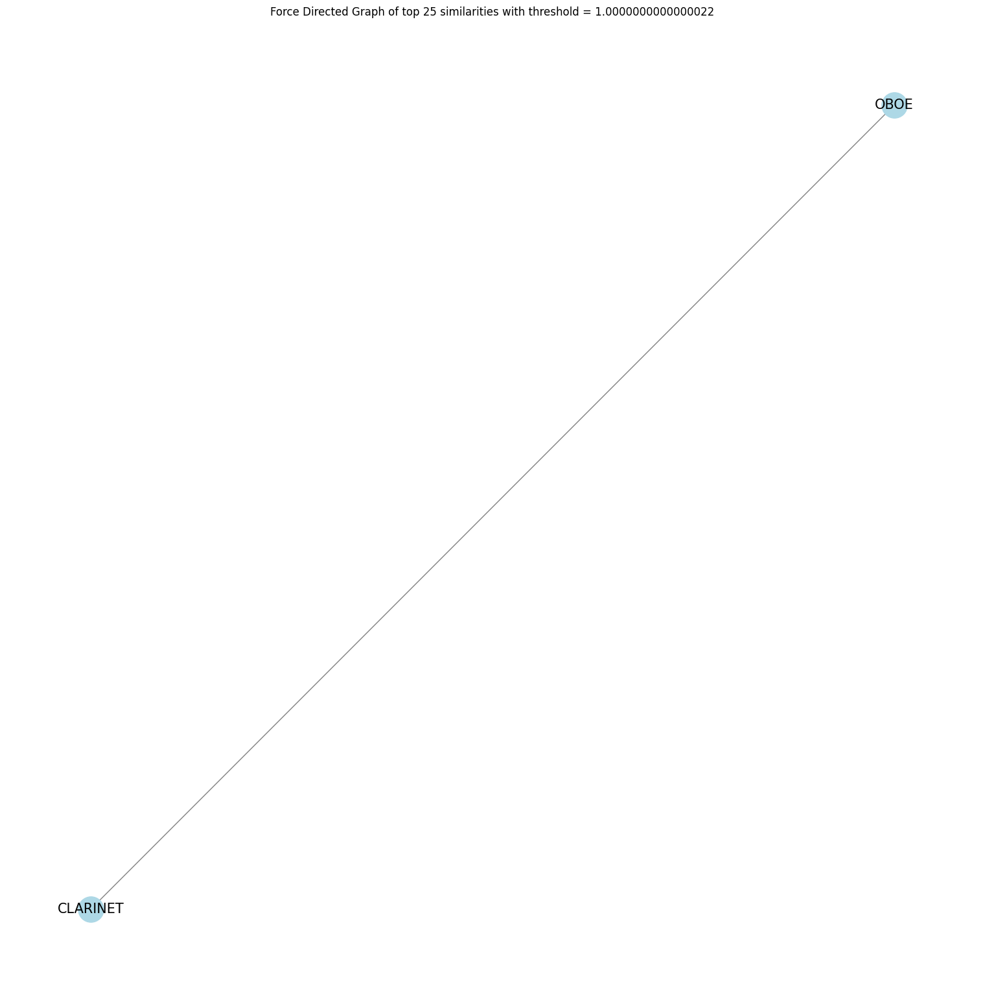

In [7]:
adjacency_matrix = similarity_matrix

# Create a graph
G = nx.Graph()

threshold = get_threshold(similarity_matrix, 25)

course_indices = set()
# Adding nodes and edges based on the adjacency matrix
for i in range(len(adjacency_matrix)):
    for j in range(i+1, len(adjacency_matrix)):
        # Add an edge between i and j with weight based on cosine similarity
        if similarity_matrix[i][j] > threshold:
            course_indices.add(i)
            course_indices.add(j)
            G.add_edge(deps[i], deps[j], weight=similarity_matrix[i][j])

# Generate positions for the nodes using a force-directed algorithm
positions = nx.spring_layout(G, weight='weight', k=0.7)

# Draw the graph
plt.figure(figsize=(15, 15))
nx.draw(G, positions, with_labels=True, node_color='lightblue', 
        node_size=800, edge_color='gray', linewidths=1, font_size=15)
plt.title(f"Force Directed Graph of top 25 similarities with threshold = {threshold}")
plt.show()

In [7]:
def cosine_similarity(vec1, vec2):
    dot_product = np.dot(vec1, vec2)
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    return dot_product / (norm_vec1 * norm_vec2)

# Statistics of similarity distribution

In [9]:
np.fill_diagonal(similarity_matrix, np.nan)
upper_tri_indices = np.triu_indices_from(similarity_matrix, k=1)
similarities = similarity_matrix[upper_tri_indices]

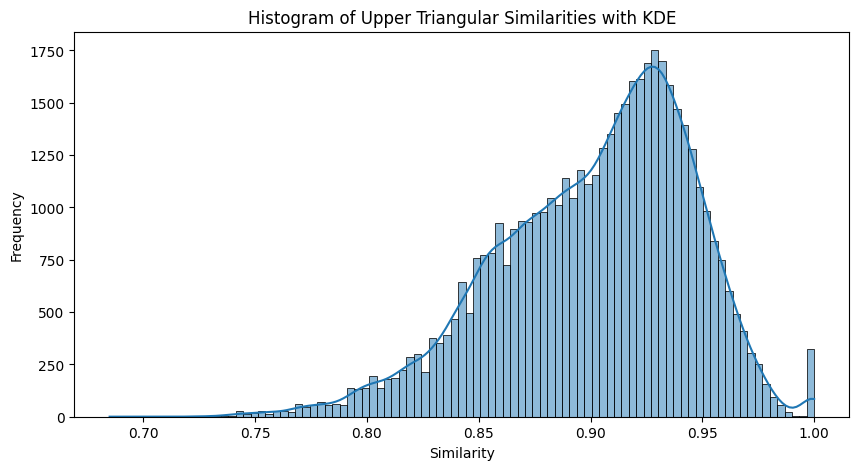

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot histogram
plt.figure(figsize=(10, 5))
sns.histplot(similarities, kde=True)
plt.title('Histogram of Upper Triangular Similarities with KDE')
plt.xlabel('Similarity')
plt.ylabel('Frequency')
plt.show()

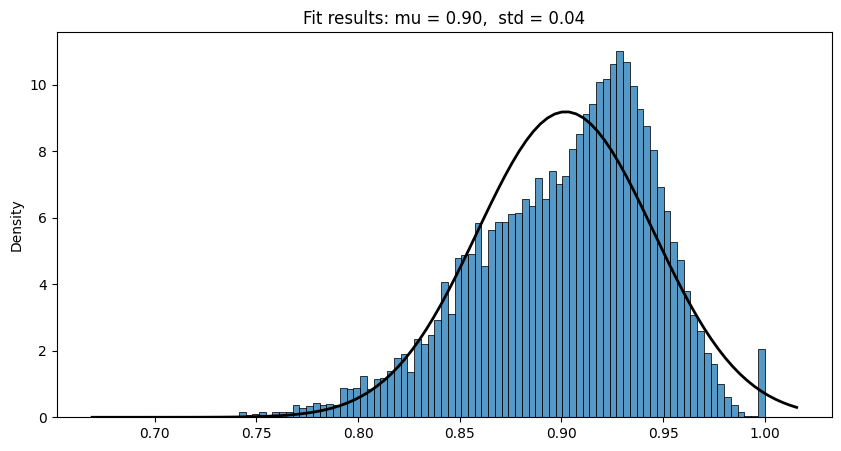

In [11]:
from scipy.stats import norm

# Fit a normal distribution
mu, std = norm.fit(similarities)

# Plot the histogram and fitted pdf
plt.figure(figsize=(10, 5))
sns.histplot(similarities, kde=False, stat="density")
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
plt.title(title)
plt.show()


## Finding pairs with similarity 1

In [8]:
ones = np.where(np.triu(np.isclose(similarity_matrix, 1.0), k=1))
idxs = list(zip(ones[0], ones[1]))

In [9]:
# Remove overlapping departments
bad_deps = set()
for pair in idxs:
    bad_deps.add(deps[pair[0]])
    bad_deps.add(deps[pair[1]])
df = df[~df['department'].isin(bad_deps)]

# Renormalizing similarities

In [10]:
from scipy import stats
# Expects np array
def renormalize_similarities(similarity_matrix):
    # Calculate z-scores
    z_scores = stats.zscore(similarity_matrix, axis=None)
    
    # Shift z-scores to make the minimum 0
    z_scores_shifted = z_scores - z_scores.min()
    
    # Rescale to [0, 1] range
    renormalized = z_scores_shifted / z_scores_shifted.max()
    
    return renormalized

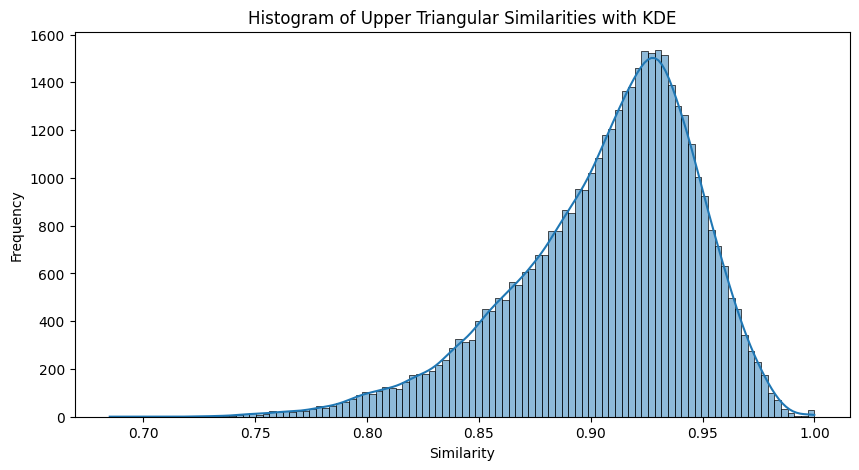

In [16]:
# Make similarity matrix (this is the df with bad deps removed)
matrix = [vec for vec in df['embedding']]
# Compute cosine similarities
similarity_matrix = mat_cosine_similarity(matrix)

# Extract similarities
np.fill_diagonal(similarity_matrix, np.nan)
upper_tri_indices = np.triu_indices_from(similarity_matrix, k=1)
similarities = similarity_matrix[upper_tri_indices]

# Plot histogram
plt.figure(figsize=(10, 5))
sns.histplot(similarities, kde=True)
plt.title('Histogram of Upper Triangular Similarities with KDE')
plt.xlabel('Similarity')
plt.ylabel('Frequency')
plt.show()

In [11]:
# Make similarity matrix (this is the df with bad deps removed)
matrix = [vec for vec in df['embedding']]
# Compute cosine similarities
similarity_matrix = mat_cosine_similarity(matrix)
#Find similar courses
deps = df['department'].tolist()

# Renormalize
similarity_matrix_normed = renormalize_similarities(similarity_matrix)

# Plot renormalizaiton

# Extract similarities
upper_tri_indices = np.triu_indices_from(similarity_matrix_normed, k=1)
similarities = similarity_matrix_normed[upper_tri_indices]

# Plot histogram
plt.figure(figsize=(10, 5))
sns.histplot(similarities, kde=True)
plt.title('Histogram of Upper Triangular Similarities')
plt.xlabel('Similarity')
plt.ylabel('Frequency')
plt.show()

NameError: name 'sns' is not defined

<Figure size 1000x500 with 0 Axes>

In [12]:
# Power transform
def transform_similarities(sim_matrix, power=2.5):
    return np.power(sim_matrix, power)

transformed_matrix = transform_similarities(similarity_matrix_normed)

# Extract similarities
upper_tri_indices = np.triu_indices_from(transformed_matrix, k=1)
similarities = transformed_matrix[upper_tri_indices]

# Plot histogram
plt.figure(figsize=(10, 5))
sns.histplot(similarities, kde=True)
plt.title('Histogram of Upper Triangular Similarities')
plt.xlabel('Similarity')
plt.ylabel('Frequency')
plt.show()

NameError: name 'sns' is not defined

<Figure size 1000x500 with 0 Axes>

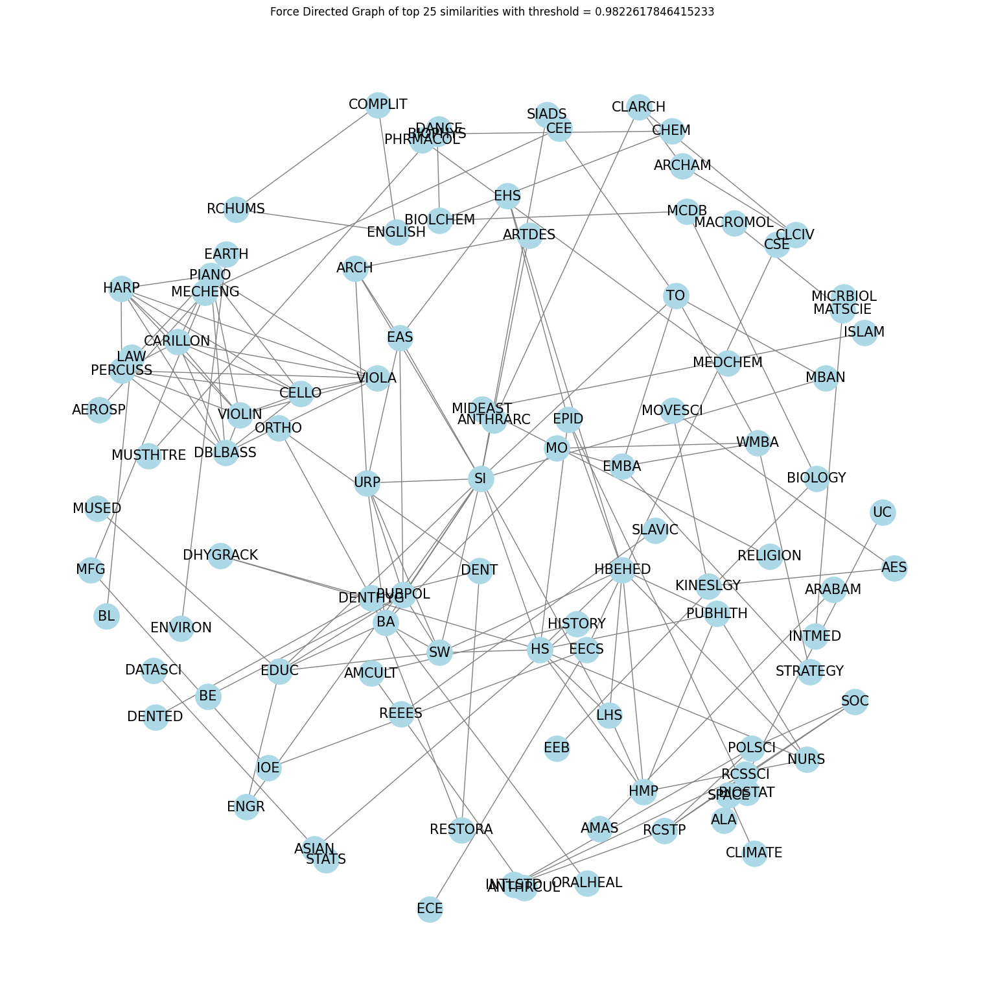

In [19]:
adjacency_matrix = similarity_matrix_normed

# Create a graph
G = nx.Graph()

threshold = get_threshold(similarity_matrix_normed, 30)

course_indices = set()
# Adding nodes and edges based on the adjacency matrix
for i in range(len(adjacency_matrix)):
    for j in range(i+1, len(adjacency_matrix)):
        # Add an edge between i and j with weight based on cosine similarity
        if similarity_matrix[i][j] >= threshold:
            course_indices.add(i)
            course_indices.add(j)
            G.add_edge(deps[i], deps[j], weight=similarity_matrix[i][j])

# Generate positions for the nodes using a force-directed algorithm
positions = nx.spring_layout(G, weight='weight', k=0.7)

# Draw the graph
plt.figure(figsize=(15, 15))
nx.draw(G, positions, with_labels=True, node_color='lightblue', 
        node_size=800, edge_color='gray', linewidths=1, font_size=15)
plt.title(f"Force Directed Graph of top 25 similarities with threshold = {threshold}")
plt.show()

C:\Users\hvand\AppData\Local\Temp\ipykernel_21100\3704511537.py:58: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


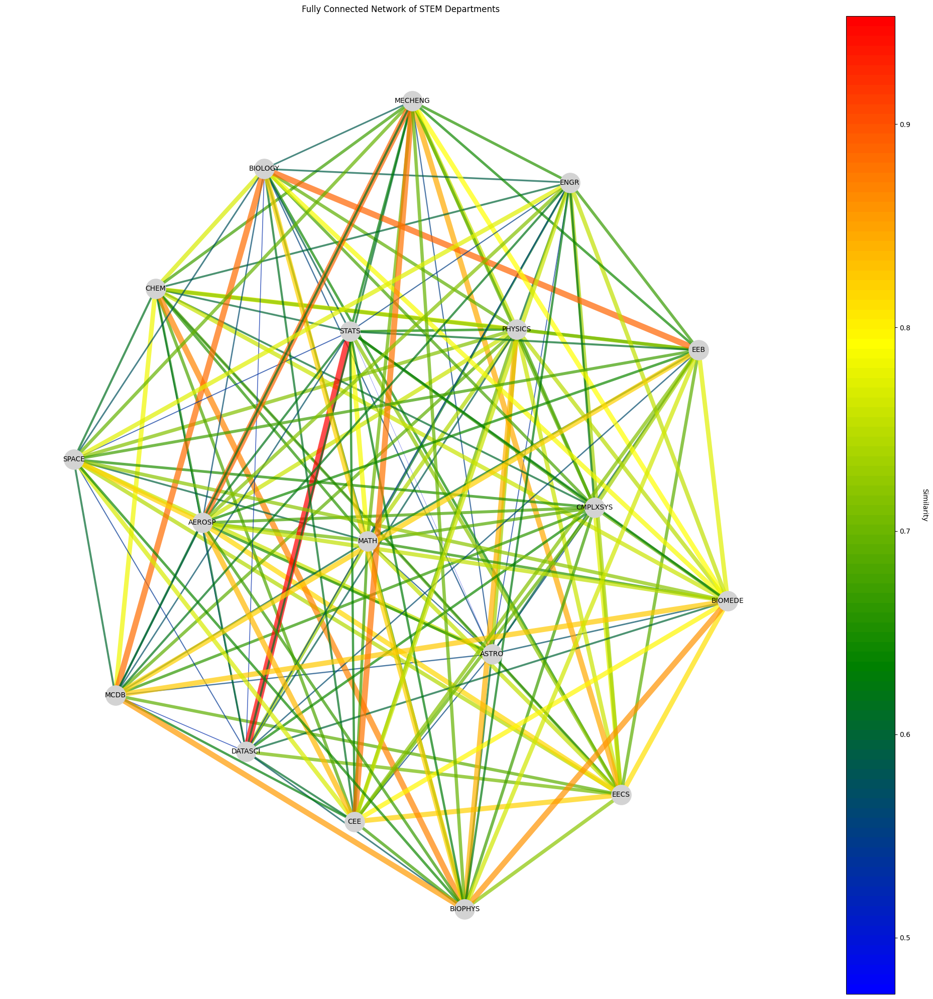

In [46]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# List of STEM departments
stem = set(["AEROSP", "EECS", "MATH", "PHYSICS", "STATS", "ENGR", "ASTRO", "CEE", "MECHENG", "DATASCI", "BIOMEDE", "BIOPHYS", "SPACE", "CHEM", "CMPLXSYS", "MCDB", "BIOLOGY", "EEB"])

# Create a fully connected graph for these departments
G = nx.Graph()

# Add all edges between these departments
for i, dept1 in enumerate(stem):
    for dept2 in list(stem)[i+1:]:
        # Get indices of these departments from deps list
        idx1 = deps.index(dept1)
        idx2 = deps.index(dept2)
        # Add edge with weight from transformed similarity matrix
        similarity = transformed_matrix[idx1][idx2]
        G.add_edge(dept1, dept2, weight=similarity, length=1/similarity)

# Generate positions for the nodes using a force-directed algorithm
positions = nx.spring_layout(G, weight='length', k=0.5, iterations=50)

# Draw the graph
plt.figure(figsize=(20, 20))

# Get edge weights and normalize them
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
max_weight = max(edge_weights)
min_weight = min(edge_weights)
normalized_weights = [(w - min_weight) / (max_weight - min_weight) for w in edge_weights]

# Create a custom colormap
colors = ['blue', 'green', 'yellow', 'red']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

# Draw edges with varying thickness, length, and color based on weight
for (u, v, d), width in zip(G.edges(data=True), normalized_weights):
    nx.draw_networkx_edges(G, positions, edgelist=[(u, v)], 
                           width=width*10, 
                           edge_color=[width], 
                           edge_cmap=cmap, 
                           edge_vmin=0, 
                           edge_vmax=1,
                           alpha=0.7)

# Draw nodes
nx.draw_networkx_nodes(G, positions, node_color='lightgrey', node_size=800)

# Draw labels
nx.draw_networkx_labels(G, positions, font_size=10)

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min_weight, vmax=max_weight))
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label('Similarity', rotation=270, labelpad=25)

plt.title("Fully Connected Network of STEM Departments")
plt.axis('off')
plt.tight_layout()
plt.show()

In [28]:
def graphSet(departmentSet, k=0.5, iterations=50):
    # Create a fully connected graph for these departments
    G = nx.Graph()

    # Add all edges between these departments
    for i, dept1 in enumerate(departmentSet):
        for dept2 in list(departmentSet)[i+1:]:
            # Get indices of these departments from deps list
            idx1 = deps.index(dept1)
            idx2 = deps.index(dept2)
            # Add edge with weight from transformed similarity matrix
            similarity = transformed_matrix[idx1][idx2]
            G.add_edge(dept1, dept2, weight=similarity, length=1/similarity)

    # Generate positions for the nodes using a force-directed algorithm
    positions = nx.spring_layout(G, weight='length', k=k, iterations=iterations)

    # Draw the graph
    plt.figure(figsize=(20, 20))

    # Get edge weights and normalize them
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
    max_weight = max(edge_weights)
    min_weight = min(edge_weights)
    normalized_weights = [(w - min_weight) / (max_weight - min_weight) for w in edge_weights]

    # Create a custom colormap
    colors = ['blue', 'green', 'yellow', 'red']
    n_bins = 100
    cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

    # Draw edges with varying thickness, length, and color based on weight
    for (u, v, d), width in zip(G.edges(data=True), normalized_weights):
        nx.draw_networkx_edges(G, positions, edgelist=[(u, v)], 
                            width=width*10, 
                            edge_color=[width], 
                            edge_cmap=cmap, 
                            edge_vmin=0, 
                            edge_vmax=1,
                            alpha=0.7)

    # Draw nodes
    nx.draw_networkx_nodes(G, positions, node_color='lightgrey', node_size=1500)

    # Draw labels
    nx.draw_networkx_labels(G, positions, font_size=40)

    # Add a colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min_weight, vmax=max_weight))
    sm.set_array([])
    cbar = plt.colorbar(sm)
    cbar.set_label('Similarity', rotation=270, labelpad=25)

    plt.title("Fully Connected Network of STEM Departments")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def graphRandomSet(n):
    """Graphs n random department similarities"""
    # Ensure n is not larger than the number of available departments
    n = min(n, len(deps))
    random_departments = random.sample(deps, n)
    
    # Use the existing graphSet function to visualize these departments
    graphSet(random_departments)

C:\Users\hvand\AppData\Local\Temp\ipykernel_23648\721095127.py:51: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


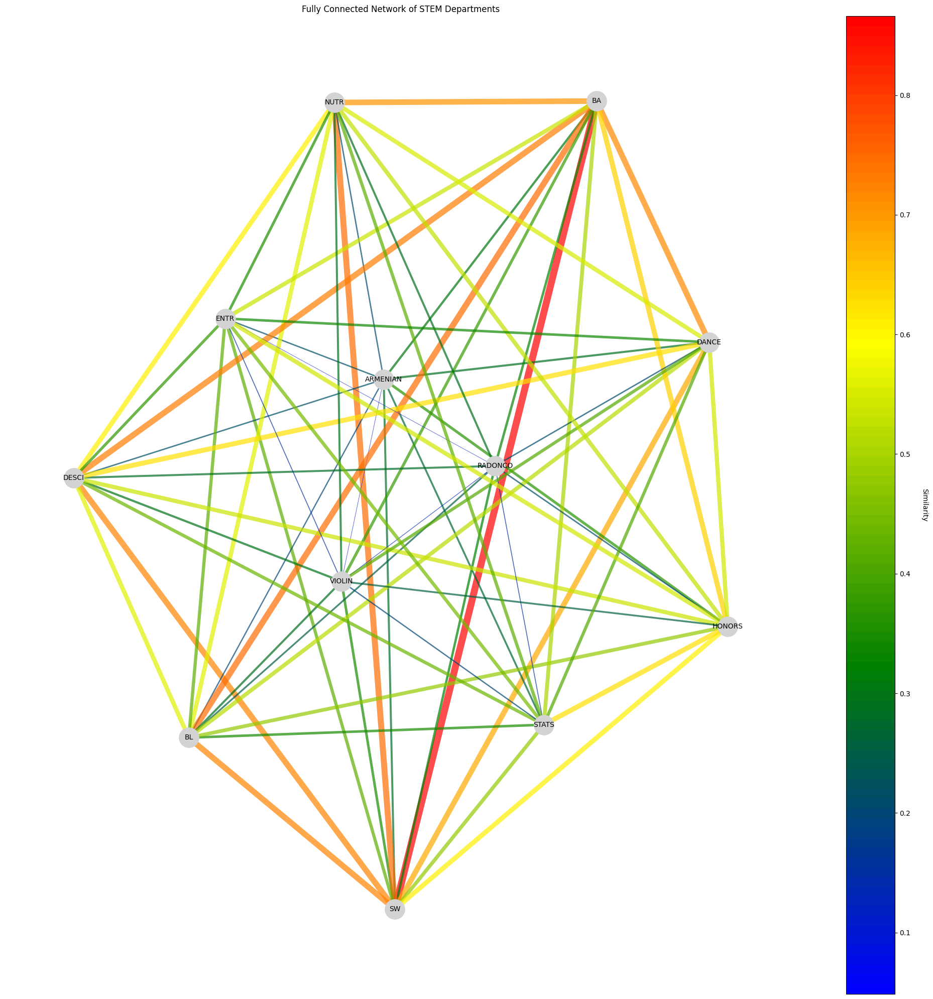

In [14]:
graphRandomSet(12)

In [47]:
stemp = set(["PHIL", "AEROSP", "EECS", "MATH", "PHYSICS", "STATS", "ENGR", "ASTRO", "CEE", "MECHENG", "DATASCI", "BIOMEDE", "BIOPHYS", "SPACE", "CHEM", "CMPLXSYS", "MCDB", "BIOLOGY", "EEB"])

C:\Users\hvand\AppData\Local\Temp\ipykernel_21100\1488023395.py:51: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


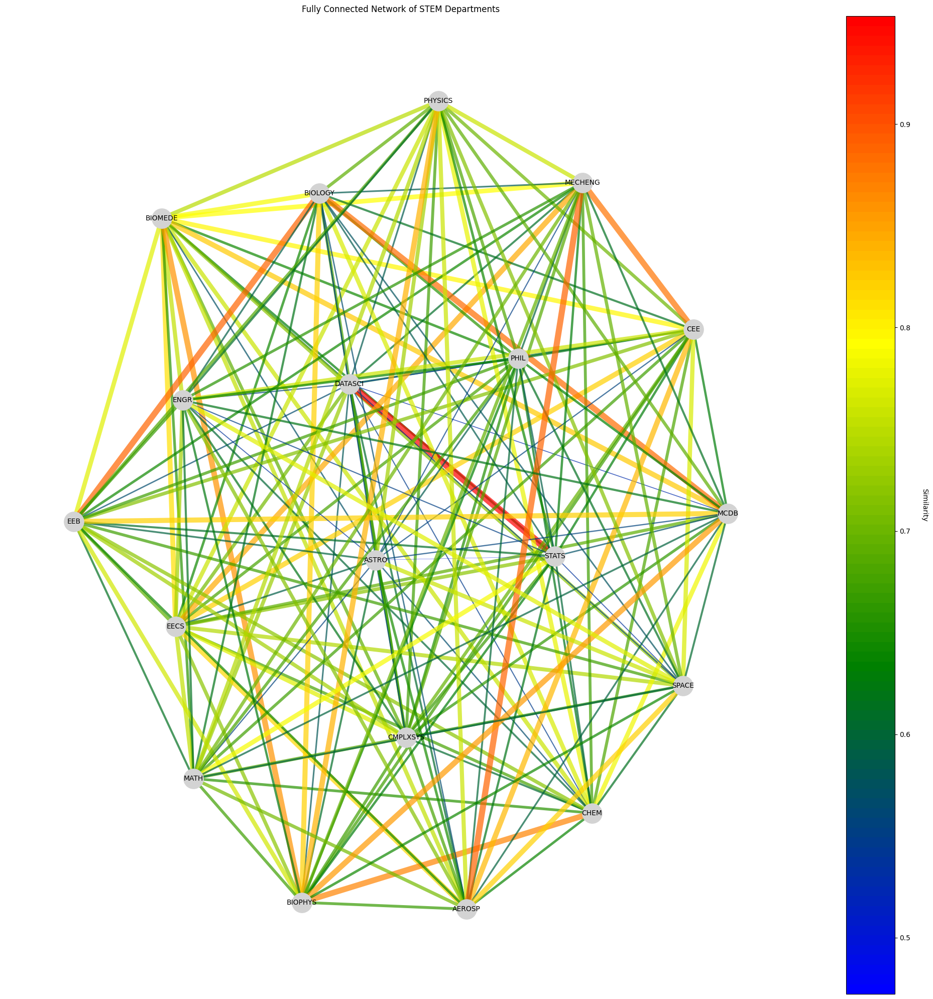

In [48]:
graphSet(stemp, k=0.8, iterations=200)

In [37]:
import csv
# Saving to a CSV file
with open('departmentList.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(deps)

C:\Users\hvand\AppData\Local\Temp\ipykernel_21100\844828923.py:51: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


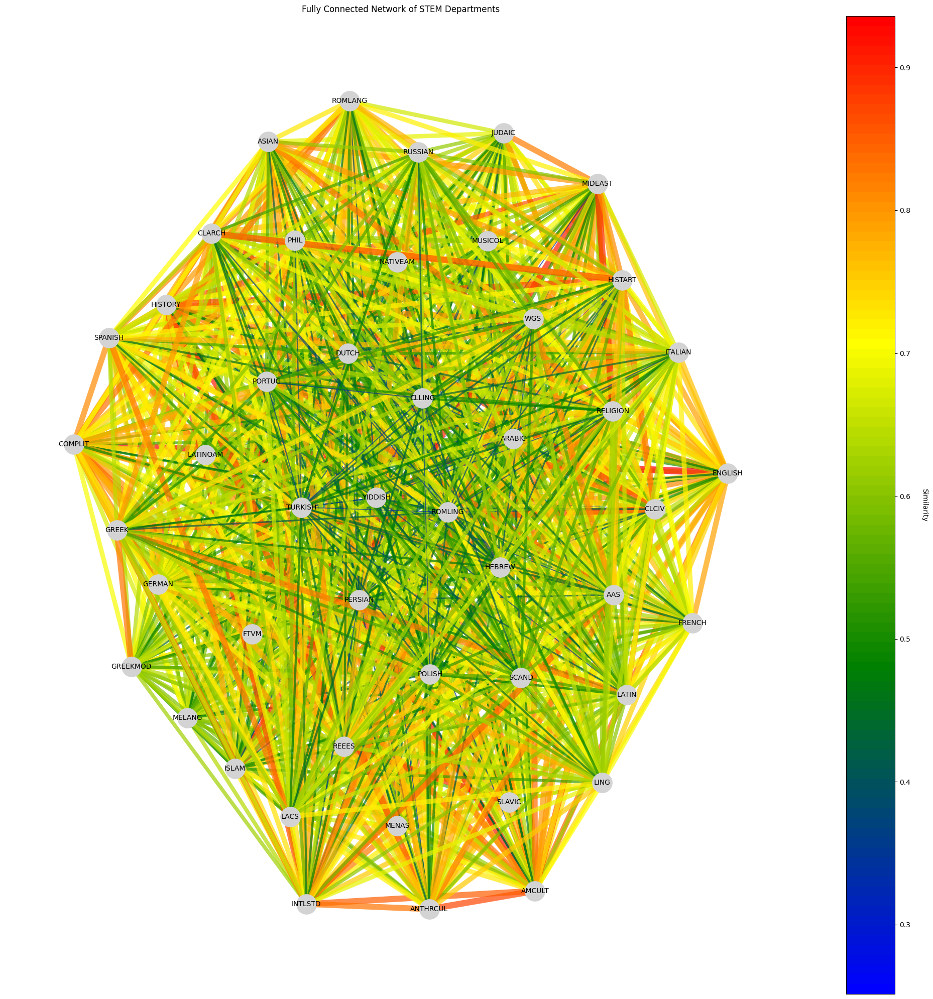

In [38]:
humanities_departments = set([
    "AAS",        # African American Studies
    "AMCULT",     # American Culture
    "ANTHRCUL",   # Cultural Anthropology
    "ARABIC",     # Arabic Studies
    "ASIAN",      # Asian Studies
    "CLARCH",     # Classical Archaeology
    "CLCIV",      # Classical Civilization
    "CLLING",     # Classical Linguistics
    "COMPLIT",    # Comparative Literature
    "DUTCH",      # Dutch Studies
    "ENGLISH",    # English
    "FTVM",       # Film, Television, and Media
    "FRENCH",     # French
    "GERMAN",     # German
    "GREEK",      # Greek
    "GREEKMOD",   # Modern Greek
    "HEBREW",     # Hebrew
    "HISTART",    # History of Art
    "HISTORY",    # History
    "INTLSTD",    # International Studies
    "ISLAM",      # Islamic Studies
    "ITALIAN",    # Italian
    "JUDAIC",     # Judaic Studies
    "LACS",       # Latin American and Caribbean Studies
    "LATIN",      # Latin
    "LATINOAM",   # Latin American Studies
    "LING",       # Linguistics
    "MELANG",     # Middle Eastern Languages
    "MENAS",      # Middle Eastern and North African Studies
    "MIDEAST",    # Middle Eastern Studies
    "MUSICOL",    # Musicology
    "NATIVEAM",   # Native American Studies
    "PERSIAN",    # Persian Studies
    "PHIL",       # Philosophy
    "POLISH",     # Polish
    "PORTUG",     # Portuguese
    "RELIGION",   # Religion
    "REEES",      # Russian, East European, and Eurasian Studies
    "ROMLANG",    # Romance Languages
    "ROMLING",    # Romance Linguistics
    "RUSSIAN",    # Russian
    "SCAND",      # Scandinavian Studies
    "SLAVIC",     # Slavic Languages and Literatures
    "SPANISH",    # Spanish
    "TURKISH",    # Turkish Studies
    "WGS",        # Women's and Gender Studies
    "YIDDISH"     # Yiddish
])
graphSet(humanities_departments)

C:\Users\hvand\AppData\Local\Temp\ipykernel_21100\1488023395.py:51: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


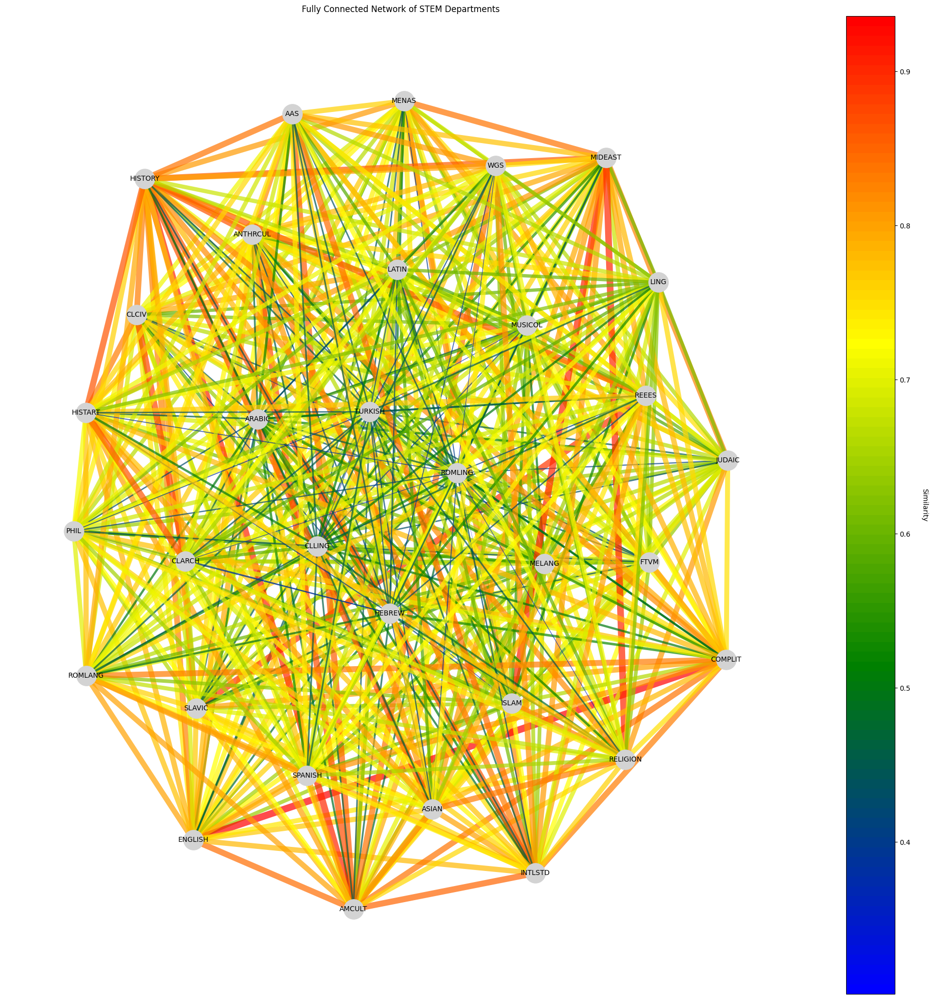

In [44]:
humanities_departments_small = set([
    "AAS",        # African American Studies
    "AMCULT",     # American Culture
    "ANTHRCUL",   # Cultural Anthropology
    "ARABIC",     # Arabic Studies
    "ASIAN",      # Asian Studies
    "CLARCH",     # Classical Archaeology
    "CLCIV",      # Classical Civilization
    "CLLING",     # Classical Linguistics
    "COMPLIT",    # Comparative Literature
    "ENGLISH",    # English
    "FTVM",       # Film, Television, and Media
    "HEBREW",     # Hebrew
    "HISTART",    # History of Art
    "HISTORY",    # History
    "INTLSTD",    # International Studies
    "ISLAM",      # Islamic Studies
    "JUDAIC",     # Judaic Studies
    "LATIN",      # Latin
    "LING",       # Linguistics
    "MELANG",     # Middle Eastern Languages
    "MENAS",      # Middle Eastern and North African Studies
    "MIDEAST",    # Middle Eastern Studies
    "MUSICOL",    # Musicology
    "PHIL",       # Philosophy
    "RELIGION",   # Religion
    "REEES",      # Russian, East European, and Eurasian Studies
    "ROMLANG",    # Romance Languages
    "ROMLING",    # Romance Linguistics
    "SLAVIC",     # Slavic Languages and Literatures
    "SPANISH",    # Spanish
    "TURKISH",    # Turkish Studies
    "WGS",        # Women's and Gender Studies
])
graphSet(humanities_departments_small, 0.8, 150)

In [15]:
humanities_departments_small = set([
    "AAS",        # African American Studies
    "AMCULT",     # American Culture
    "ANTHRCUL",   # Cultural Anthropology
    "ARABIC",     # Arabic Studies
    "ASIAN",      # Asian Studies
    "COMPLIT",    # Comparative Literature
    "ENGLISH",    # English
    "FTVM",       # Film, Television, and Media
    "HEBREW",     # Hebrew
    "HISTORY",    # History
    "ISLAM",      # Islamic Studies
    "JUDAIC",     # Judaic Studies
    "LING",       # Linguistics
    "MIDEAST",    # Middle Eastern Studies
    "PHIL",       # Philosophy
    "RELIGION",   # Religion
])

C:\Users\hvand\AppData\Local\Temp\ipykernel_23648\2126025987.py:51: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


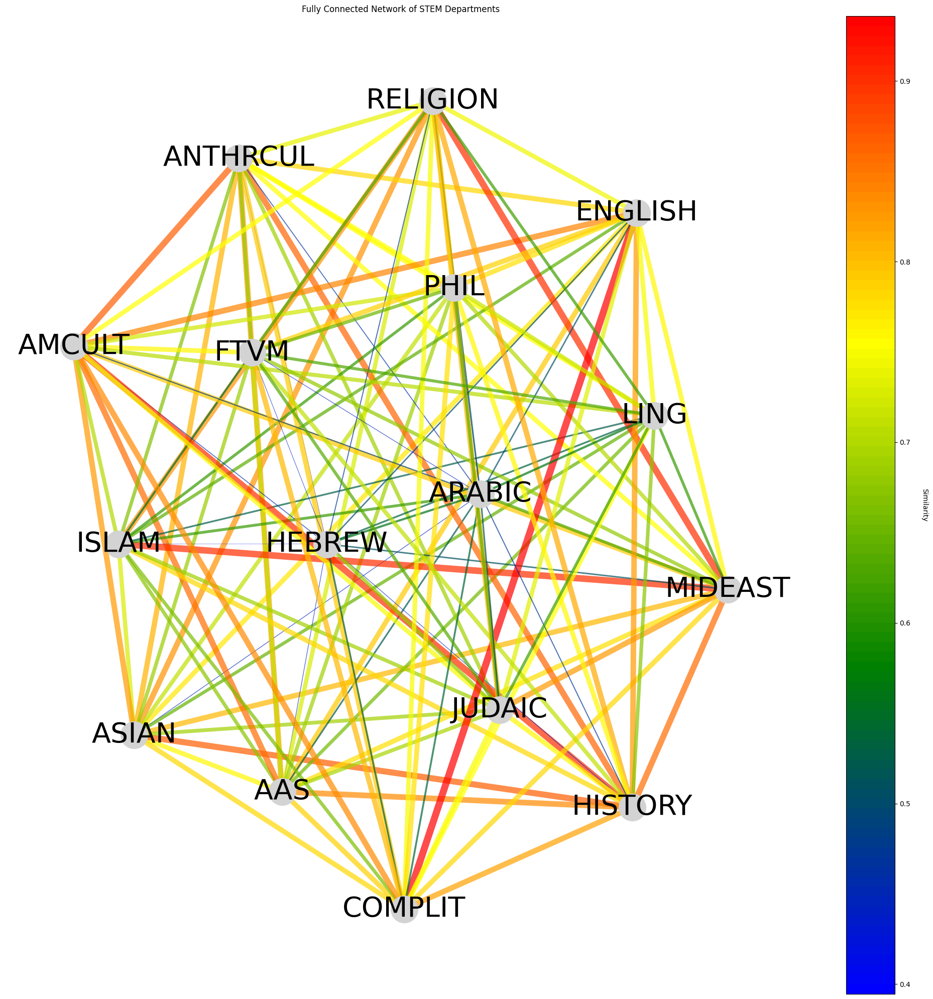

In [29]:
graphSet(humanities_departments_small)